# SSPs Calibration: Benveniste

Our working local folders for this calibration are contained in the parent folder of this notebook, in _calibration/Benveniste_

The authors of Benveniste et al., 2020 provided us with three data files in the _data_ subfolder, including _all_ssp_em.csv_, _all_ssp_gdp.csv_, and _all_ssp_pop.csv_, which we will post process below.

In [1]:
using Pkg
Pkg.activate(".")
Pkg.add("CSVFiles")
Pkg.add("Query")
Pkg.add("DataFrames")
Pkg.add("Missings")
Pkg.add("VegaLite")

using CSVFiles, Query, DataFrames, Missings, VegaLite

  Activating project at `~/.julia/dev/MimiSSPs/calibration/Benveniste`
   Resolving package versions...
  No Changes to `~/.julia/dev/MimiSSPs/calibration/Benveniste/Project.toml`
  No Changes to `~/.julia/dev/MimiSSPs/calibration/Benveniste/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/dev/MimiSSPs/calibration/Benveniste/Project.toml`
  No Changes to `~/.julia/dev/MimiSSPs/calibration/Benveniste/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/dev/MimiSSPs/calibration/Benveniste/Project.toml`
  No Changes to `~/.julia/dev/MimiSSPs/calibration/Benveniste/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/dev/MimiSSPs/calibration/Benveniste/Project.toml`
  No Changes to `~/.julia/dev/MimiSSPs/calibration/Benveniste/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/dev/MimiSSPs/calibration/Benveniste/Project.toml`
  No Changes to `~/.julia/dev/MimiSSPs/calibration/Benveniste/Manifest.toml`

## Socioeconomic Data

In [2]:
gdp_df = load(joinpath(@__DIR__, "data", "all_ssp_gdp.csv")) |>
    @select(:period, :scen, :country, :gdp_mig) |>
    DataFrame

pop_df = load(joinpath(@__DIR__, "data", "all_ssp_pop.csv")) |>
    @select(:period, :scen, :country, :pop_mig) |>
    DataFrame

socio_df = innerjoin(gdp_df, pop_df, on = [:period, :scen, :country]);

In [3]:
for scen in unique(gdp_df.scen)

    # filter
    df = socio_df |> 
        @filter(_.scen == scen) |>
        DataFrame

    # remove scenario from table
    select!(df, Not(:scen))

    # rename fields
    rename!(df, [:year, :country, :gdp, :pop])
    
    # gdp is in billions of USD in $2005
    # convert population from thousands to millions
    df.pop = df.pop ./ 1e3

    df |> save(joinpath(@__DIR__, "..", "..", "data", "socioeconomic", "Benveniste_$(scen).csv"))
end

## Emissions Data

Note that for emissions, Benveniste et al., 2020 provides emissions at the country level but here we aggregate to global to fit the expected format of our components.  In addition, Benveniste et al., 2020 only provides CO2 emissions, not CH4, SF6, or N2O, so this will be handled by the components.

In [ ]:
em_df = load(joinpath(@__DIR__, "data", "all_ssp_em.csv")) |> DataFrame

scenario_dict = Dict(
    "SSP1-1.9-SPA1" => "SSP119",
    "SSP2-4.5-SPA2" => "SSP245",
    "SSP3-7.0-SPA0" => "SSP370",
    "SSP4-6.0-SPA4" => "SSP460",
    "SSP5-8.5"      => "SSP585"
)

for scenario in unique(em_df.scenario)
    println("Working on emissions for $scenario ...")
    df = DataFrame(:year => [], :carbon_dioxide => [])
    for year in unique(em_df.period)
        em_data = em_df |> 
            @filter(_.scenario == scenario && _.period == year) |> 
            @select(:em_mig) |> DataFrame

        # sum over countries and convert from Mt CO2 to Gt C
        total_em = 12/44 .* sum(skipmissing(em_data.em_mig)) ./ 1e3 

        append!(df, DataFrame(:year => year, :carbon_dioxide => total_em)) # sum over countries and convert 
    end
    df |> save(joinpath(@__DIR__, "..", "..", "data", "emissions", "Benveniste_$(scenario_dict[scenario]).csv"))
end

## Compare 2021 Data to 2024 Data Update

### Population

In [16]:
pop_2024 = load(joinpath(@__DIR__, "data", "all_ssp_pop.csv")) |> DataFrame
pop_2021 = load(joinpath(@__DIR__, "data", "data_2021", "all_ssp_pop.csv")) |> DataFrame;

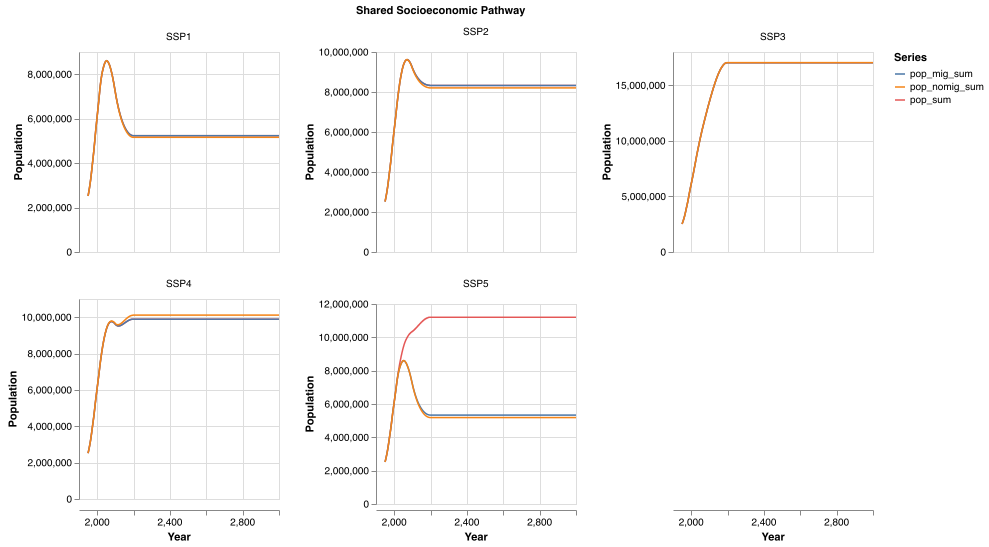

In [17]:
gdf = groupby(pop_2021, [:period, :scen])
pop_2021_global = combine(gdf, :pop => sum)

gdf = groupby(pop_2024, [:period, :scen])
pop_2024_global = combine(gdf, :pop_mig => sum, :pop_nomig => sum)

df = innerjoin(pop_2021_global, pop_2024_global, on = [:period, :scen])

p = stack(df, Not(:period, :scen)) |>
    @vlplot(
        resolve = {scale = {y = :independent}},
        mark = {:line, size = 1.5},
        x = {"period:q", title = "Year"},
        y = {"value:q", title = "Population"},
        color = {:variable, title = "Series"},
        wrap = {:scen, title = "Shared Socioeconomic Pathway"},
        columns = 3
    )
p |> save(joinpath(@__DIR__, "Compare_pop.png"), ppi = 300)
p

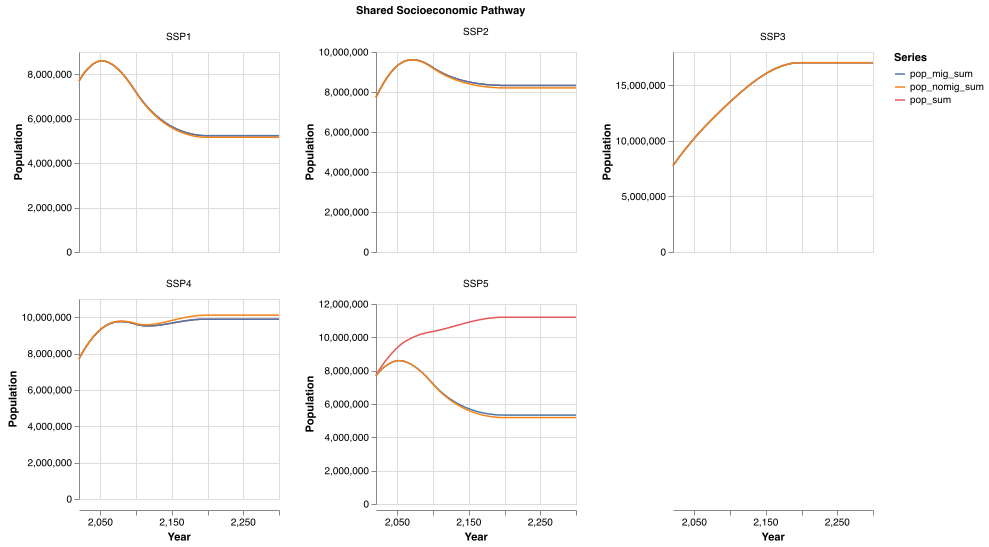

In [18]:
p = stack(df, Not(:period, :scen)) |>
    @filter(_.period in collect(2020:2300)) |>
    @vlplot(
        resolve = {scale = {y = :independent}},
        mark = {:line, size = 1.5},
        x = {"period:q", title = "Year"},
        y = {"value:q", title = "Population"},
        color = {:variable, title = "Series"},
        wrap = {:scen, title = "Shared Socioeconomic Pathway"},
        columns = 3
    )
p |> save(joinpath(@__DIR__, "Compare_pop_to2300.png"), ppi = 300)
p

### GDP

In [19]:
gdp_2024 = load(joinpath(@__DIR__, "data", "all_ssp_gdp.csv")) |> DataFrame
gdp_2021 = load(joinpath(@__DIR__, "data", "data_2021", "all_ssp_gdp.csv")) |> DataFrame;

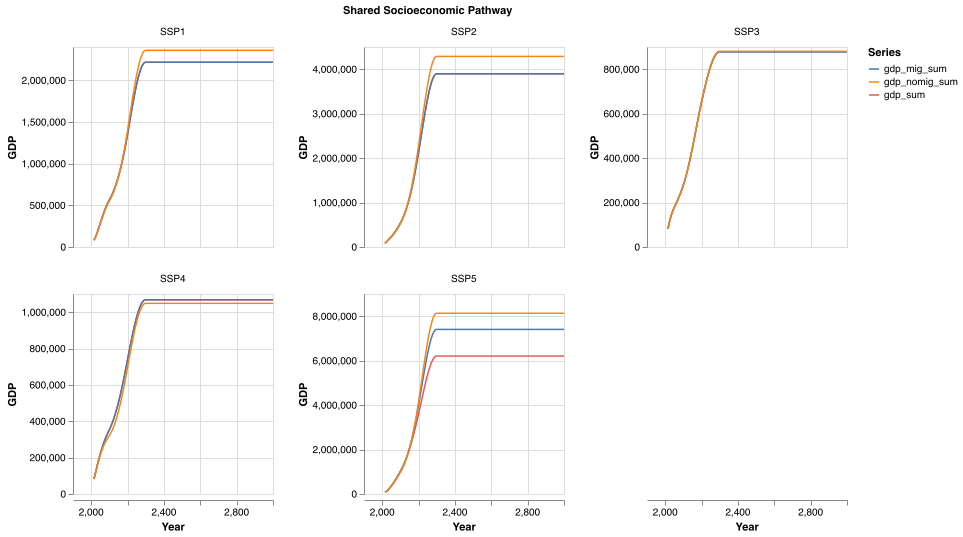

In [20]:
gdf = groupby(gdp_2021, [:period, :scen])
gdp_2021_global = combine(gdf, :gdp => sum)

gdf = groupby(gdp_2024, [:period, :scen])
gdp_2024_global = combine(gdf, :gdp_mig => sum, :gdp_nomig => sum)

df = innerjoin(gdp_2021_global, gdp_2024_global, on = [:period, :scen])

p = stack(df, Not(:period, :scen)) |>
    @vlplot(
        resolve = {scale = {y = :independent}},
        mark = {:line, size = 1.5},
        x = {"period:q", title = "Year"},
        y = {"value:q", title = "GDP"},
        color = {:variable, title = "Series"},
        wrap = {:scen, title = "Shared Socioeconomic Pathway"},
        columns = 3
    )
p |> save(joinpath(@__DIR__, "Compare_GDP.png"), ppi = 300)
p

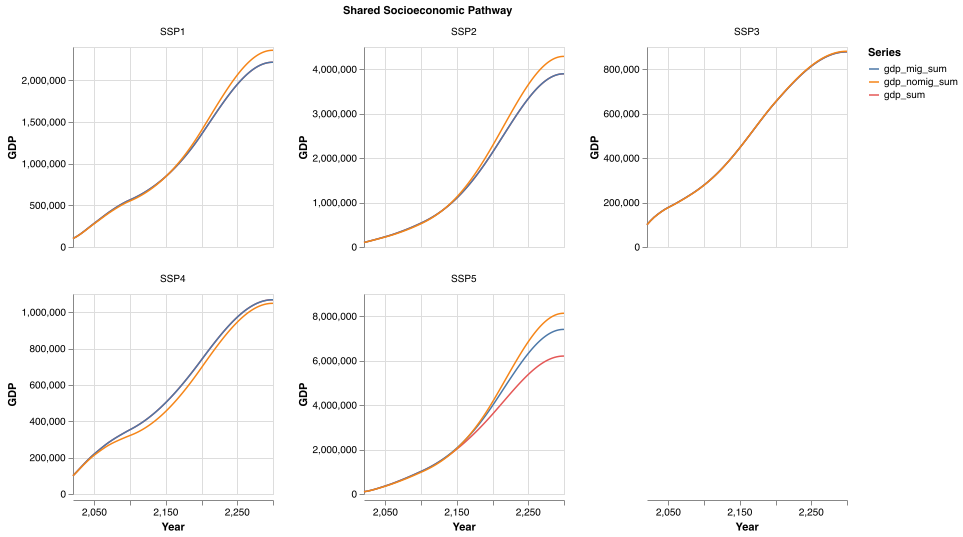

In [21]:
p = stack(df, Not(:period, :scen)) |>
    @filter(_.period in collect(2020:2300)) |>
    @vlplot(
        resolve = {scale = {y = :independent}},
        mark = {:line, size = 1.5},
        x = {"period:q", title = "Year"},
        y = {"value:q", title = "GDP"},
        color = {:variable, title = "Series"},
        wrap = {:scen, title = "Shared Socioeconomic Pathway"},
        columns = 3
    )
p |> save(joinpath(@__DIR__, "Compare_GDP_to2300.png"), ppi = 300)
p

### Emissions

In [10]:
em_2024 = load(joinpath(@__DIR__, "data", "all_ssp_em.csv")) |> DataFrame
em_2021 = load(joinpath(@__DIR__, "data", "data_2021", "all_ssp_em.csv")) |> DataFrame;

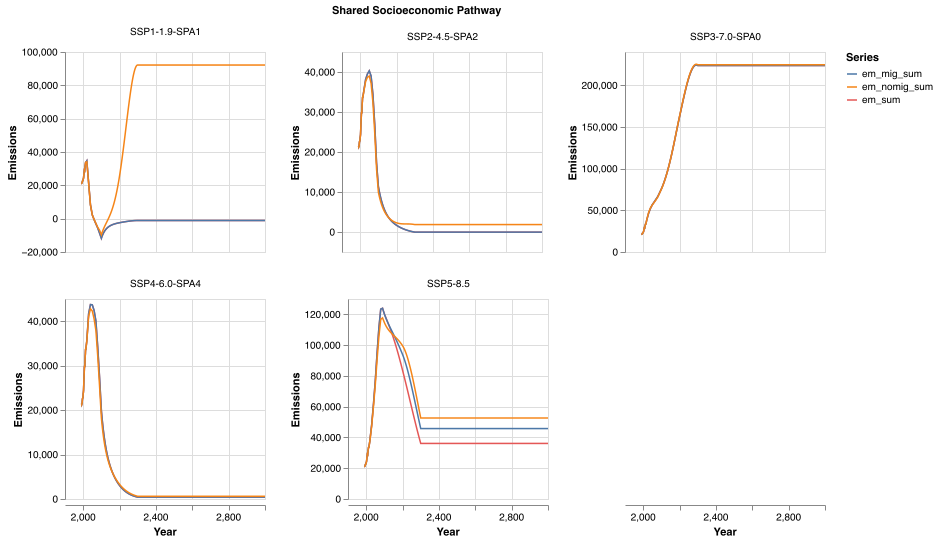

In [11]:
gdf = groupby(em_2021, [:period, :scenario])
em_2021_global = combine(gdf, :em => sum)

gdf = groupby(em_2024, [:period, :scenario])
em_2024_global = combine(gdf, :em_mig => sum, :em_nomig => sum)

df = innerjoin(em_2021_global, em_2024_global, on = [:period, :scenario])

p = stack(df, Not(:period, :scenario)) |>
    @vlplot(
        resolve = {scale = {y = :independent}},
        mark = {:line, size = 1.5},
        x = {"period:q", title = "Year"},
        y = {"value:q", title = "Emissions"},
        color = {:variable, title = "Series"},
        wrap = {:scenario, title = "Shared Socioeconomic Pathway"},
        columns = 3
    )
p |> save(joinpath(@__DIR__, "Compare_Emissions.png"), ppi = 300)
p

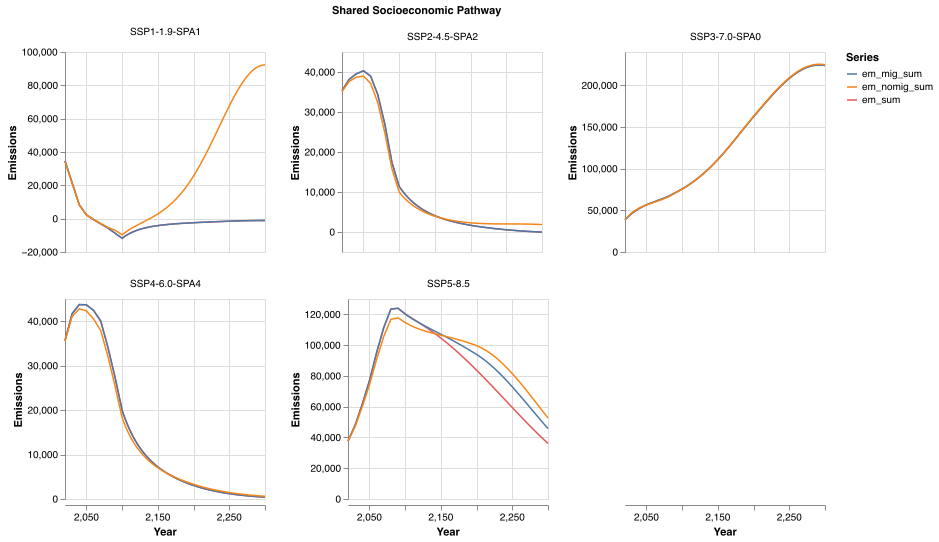

In [12]:
p = stack(df, Not(:period, :scenario)) |>
    @filter(_.period in collect(2020:2300)) |>
    @vlplot(
        resolve = {scale = {y = :independent}},
        mark = {:line, size = 1.5},
        x = {"period:q", title = "Year"},
        y = {"value:q", title = "Emissions"},
        color = {:variable, title = "Series"},
        wrap = {:scenario, title = "Shared Socioeconomic Pathway"},
        columns = 3
    )
p |> save(joinpath(@__DIR__, "Compare_Emissions_to2300.png"), ppi = 300)
p